<a href="https://colab.research.google.com/github/Muskan2320/Data-Science/blob/main/Exploratory_Data_Analysis_Terrorism.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Data source: Kaggle (https://www.kaggle.com/datasets/START-UMD/gtd)

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
from google.colab import drive
drive.mount('/content/drive/')

!unzip /content/drive/MyDrive/global_terrorism.csv.zip

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).
Archive:  /content/drive/MyDrive/global_terrorism.csv.zip
  inflating: globalterrorismdb_0718dist.csv  


# Data Read

In [ ]:
data = pd.read_csv('globalterrorismdb_0718dist.csv', encoding='ISO-8859-1')
data.head()

<ipython-input-7-87add1496950>:1: DtypeWarning: Columns (4,6,31,33,61,62,63,76,79,90,92,94,96,114,115,121) have mixed types. Specify dtype option on import or set low_memory=False.
  data = pd.read_csv('globalterrorismdb_0718dist.csv', encoding='ISO-8859-1')


,eventid,iyear,imonth,iday,approxdate,extended,resolution,country,country_txt,region,...,addnotes,scite1,scite2,scite3,dbsource,INT_LOG,INT_IDEO,INT_MISC,INT_ANY,related
0,197000000001,1970,7,2,NaN,0,NaN,58,Dominican Republic,2,...,NaN,NaN,NaN,NaN,PGIS,0,0,0,0,NaN
1,197000000002,1970,0,0,NaN,0,NaN,130,Mexico,1,...,NaN,NaN,NaN,NaN,PGIS,0,1,1,1,NaN
2,197001000001,1970,1,0,NaN,0,NaN,160,Philippines,5,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
3,197001000002,1970,1,0,NaN,0,NaN,78,Greece,8,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN
4,197001000003,1970,1,0,NaN,0,NaN,101,Japan,4,...,NaN,NaN,NaN,NaN,PGIS,-9,-9,1,1,NaN


In [ ]:
print(data.columns)

data = data[['iyear', 'imonth', 'iday', 'country_txt', 'region_txt', 'latitude',
       'longitude', 'success', 'attacktype1_txt', 'targtype1_txt', 'gname', 'weaptype1_txt', 'nkill']]

data.head()

Index(['eventid', 'iyear', 'imonth', 'iday', 'approxdate', 'extended',
       'resolution', 'country', 'country_txt', 'region',
       ...
       'addnotes', 'scite1', 'scite2', 'scite3', 'dbsource', 'INT_LOG',
       'INT_IDEO', 'INT_MISC', 'INT_ANY', 'related'],
      dtype='object', length=135)


,iyear,imonth,iday,country_txt,region_txt,latitude,longitude,success,attacktype1_txt,targtype1_txt,gname,weaptype1_txt,nkill
0,1970,7,2,Dominican Republic,Central America & Caribbean,18.456792,-69.951164,1,Assassination,Private Citizens & Property,MANO-D,Unknown,1.0
1,1970,0,0,Mexico,North America,19.371887,-99.086624,1,Hostage Taking (Kidnapping),Government (Diplomatic),23rd of September Communist League,Unknown,0.0
2,1970,1,0,Philippines,Southeast Asia,15.478598,120.599741,1,Assassination,Journalists & Media,Unknown,Unknown,1.0
3,1970,1,0,Greece,Western Europe,37.997490,23.762728,1,Bombing/Explosion,Government (Diplomatic),Unknown,Explosives,NaN
4,1970,1,0,Japan,East Asia,33.580412,130.396361,1,Facility/Infrastructure Attack,Government (Diplomatic),Unknown,Incendiary,NaN


In [ ]:
data.rename(columns={'iyear':'Year', 'imonth':'Month', 'iday':'Day', 'country_txt':'Country', 'region_txt':'Region',
                     'longitude':'Longitude', 'latitude':'Latitude', 'success':'Success', 'attacktype1_txt':'Attack_type',
                     'targtype1_txt':'Target_type', 'gname':'Gang_name', 'weaptype1_txt':'Weapon_type', 'nkill':'Number_killed'}, inplace=True)

print(data.columns)

Index(['Year', 'Month', 'Day', 'Country', 'Region', 'Latitude', 'Longitude',
       'Success', 'Attack_type', 'Target_type', 'Gang_name', 'Weapon_type',
       'Number_killed'],
      dtype='object')


<ipython-input-14-798569cdf778>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  data.rename(columns={'iyear':'Year', 'imonth':'Month', 'iday':'Day', 'country_txt':'Country', 'region_txt':'Region',


In [ ]:
data.shape

(181691, 13)

# Data Cleaning

In [ ]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 181691 entries, 0 to 181690
Data columns (total 13 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   Year           181691 non-null  int64  
 1   Month          181691 non-null  int64  
 2   Day            181691 non-null  int64  
 3   Country        181691 non-null  object 
 4   Region         181691 non-null  object 
 5   Latitude       177135 non-null  float64
 6   Longitude      177134 non-null  float64
 7   Success        181691 non-null  int64  
 8   Attack_type    181691 non-null  object 
 9   Target_type    181691 non-null  object 
 10  Gang_name      181691 non-null  object 
 11  Weapon_type    181691 non-null  object 
 12  Number_killed  171378 non-null  float64
dtypes: float64(3), int64(4), object(6)
memory usage: 18.0+ MB


In [ ]:
data.isnull().sum()

Year                 0
Month                0
Day                  0
Country              0
Region               0
Latitude          4556
Longitude         4557
Success              0
Attack_type          0
Target_type          0
Gang_name            0
Weapon_type          0
Number_killed    10313
dtype: int64

In [ ]:
data['Number_killed'].fillna(0, inplace=True)

data['Number_killed'].isnull().sum()

0

# Exploratory Data Analysis

## Yearly Trends

In [ ]:
yearly_attack = data.groupby('Year').size().reset_index(name = 'count')
# size() function returns the number of attacks in each year(or number of times each year appeared in dataset)
# reset_index() used to reset the index on the basis of count
# specifying the parameter name gives the desired name to the new created column(here it is 'count')
yearly_attack

,Year,count
0,1970,651
1,1971,471
2,1972,568
3,1973,473
4,1974,581
5,1975,740
6,1976,923
7,1977,1319
8,1978,1526
9,1979,2662


Maximum Attacks
    Year  count
43  2014  16903


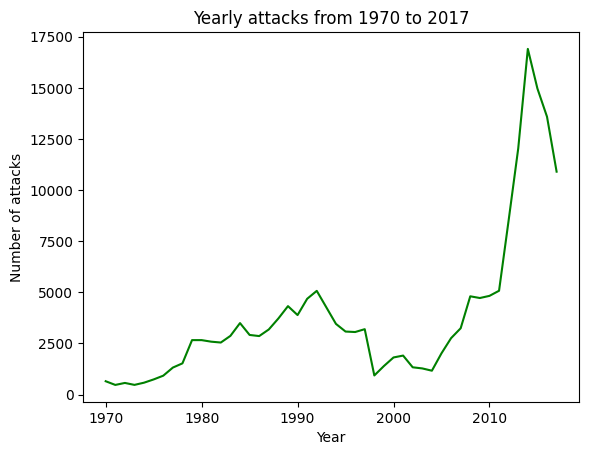

In [ ]:
sns.lineplot(x = 'Year', y = 'count', data = yearly_attack, color = 'green')
plt.xlabel("Year")
plt.ylabel("Number of attacks")
plt.title("Yearly attacks from 1970 to 2017")
print("Maximum Attacks:")
print(yearly_attack[yearly_attack['count']==max(yearly_attack['count'])])

## Most attacked countries

In [ ]:
yearly_country_attacks = data.groupby(['Year', 'Country']).size().reset_index(name='count')

In [ ]:
country  = data.groupby(['Country']).size().reset_index(name='count').sort_values(by='count')
country_10 = list(country['Country'][-10:].values)

country_10

['Turkey',
 'United Kingdom',
 'El Salvador',
 'Peru',
 'Philippines',
 'Colombia',
 'India',
 'Afghanistan',
 'Pakistan',
 'Iraq']

Text(0.5, 1.0, 'Yearly attacks in different countries from 1970 to 2017')

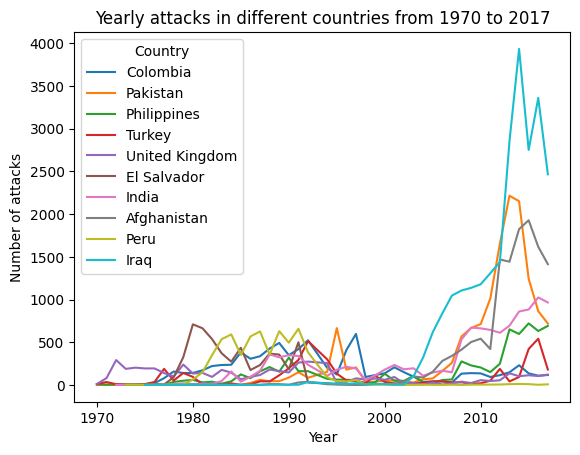

In [ ]:
yearly_country_attacks = yearly_country_attacks[yearly_country_attacks['Country'].isin(country_10)]

sns.lineplot(x = 'Year', y = 'count', hue = 'Country', data = yearly_country_attacks)
plt.xlabel("Year")
plt.ylabel("Number of attacks")
plt.title("Yearly attacks in different countries from 1970 to 2017")

Text(0.5, 1.0, 'Top 10 most atttacked countries')

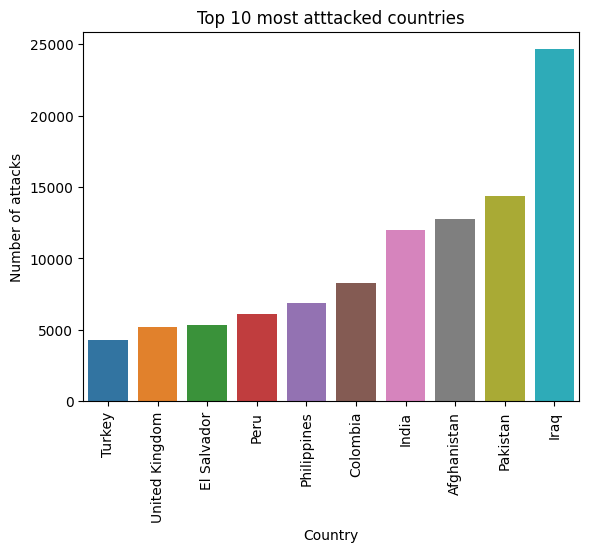

In [ ]:
country_data = country[-10:]

sns.barplot(x='Country', y='count', data=country_data)
plt.xlabel("Country")
plt.xticks(rotation=90)
plt.ylabel("Number of attacks")
plt.title("Top 10 most atttacked countries")

## Countries and Regions attacked in 2014

In [ ]:
data_14 = data[data['Year'] == 2014]

Text(0.5, 1.0, 'Most attacked countries in 2014')

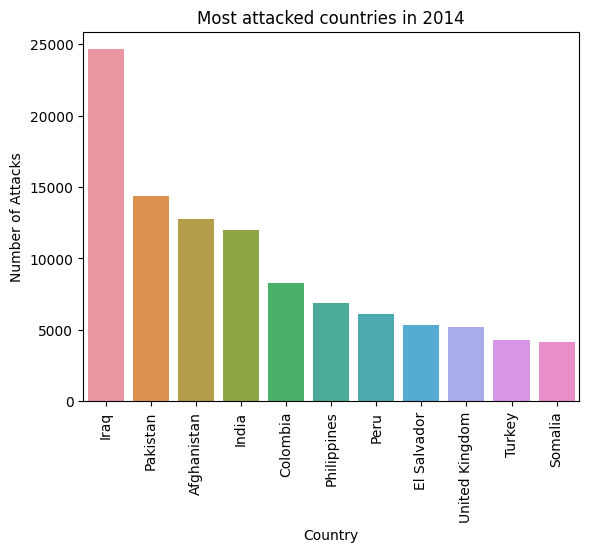

In [ ]:
con_14 = data.groupby(['Country']).size().reset_index(name='count').sort_values(by='count', ascending = False)
con_14 = con_14[:11]

sns.barplot(x='Country', y='count', data=con_14)
plt.xlabel('Country')
plt.xticks(rotation=90)
plt.ylabel('Number of Attacks')
plt.title('Most attacked countries in 2014')

Text(0.5, 1.0, 'Most attacked regions in 2014')

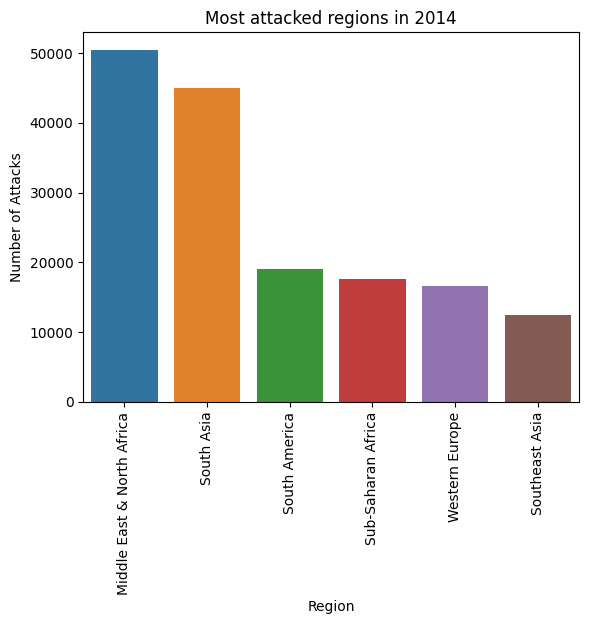

In [ ]:
reg_14 = data.groupby(['Region']).size().reset_index(name='count').sort_values(by='count', ascending = False)
reg_14 = reg_14[:6]

sns.barplot(x='Region', y='count', data=reg_14)
plt.xlabel('Region')
plt.xticks(rotation=90)
plt.ylabel('Number of Attacks')
plt.title('Most attacked regions in 2014')

## Successful and unsuccessful attacks

Percentage of success:  88.95982739926579


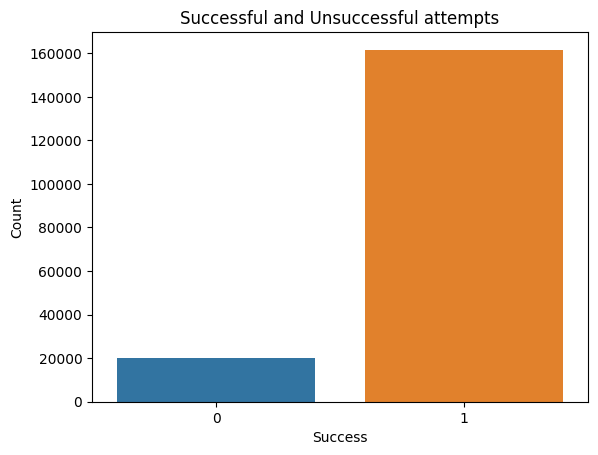

In [ ]:
succ_data = data.groupby(['Success']).size().reset_index(name='count')

sns.barplot(x='Success', y='count', data=succ_data)
plt.xlabel('Success')
plt.ylabel('Count')
plt.title("Successful and Unsuccessful attempts")
print("Percentage of success: ", succ_data['count'][1]/(succ_data['count'][0] + succ_data['count'][1])*100)

## Successful attacks in India

Percentage of success:  85.95317725752508


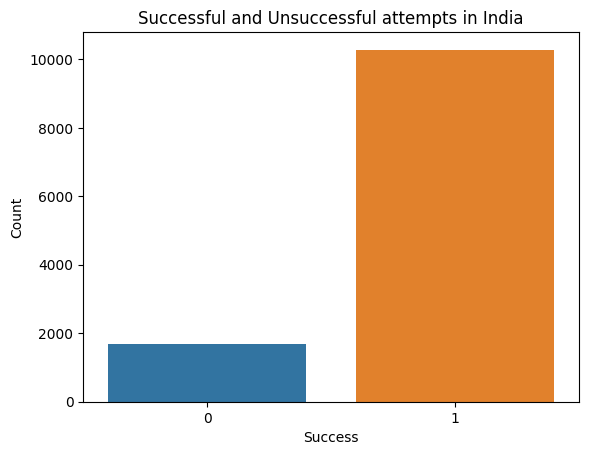

In [ ]:
in_data = data[data['Country'] == 'India']
in_data = in_data.groupby(['Success']).size().reset_index(name='count')

sns.barplot(x='Success', y='count', data=in_data)
plt.xlabel('Success')
plt.ylabel('Count')
plt.title("Successful and Unsuccessful attempts in India")
print("Percentage of success: ", in_data['count'][1]/(in_data['count'][0] + in_data['count'][1])*100)

## People killed in India

Text(0.5, 1.0, 'Person killed in India')

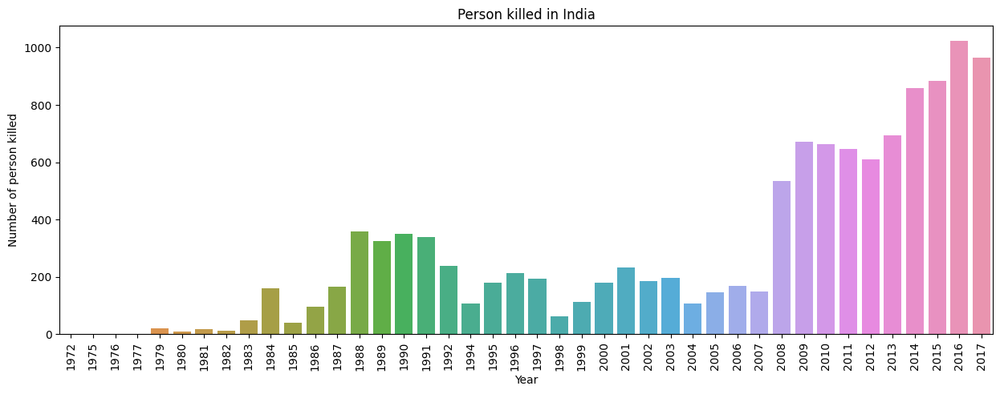

In [ ]:
killed = data[data['Country'] == 'India']
killed = killed[['Year', 'Number_killed']]
killed = killed.groupby(['Year']).size().reset_index(name='count')

plt.figure(figsize=(15, 5))
sns.barplot(x='Year', y='count', data=killed)
plt.xlabel('Year')
plt.xticks(rotation=90)
plt.ylabel('Number of person killed')
plt.title("Person killed in India")

## Attacks with major life loss

In [ ]:
attack = data.sort_values(by='Number_killed', ascending = False)[:60]

attack = attack.pivot_table(index='Country', columns='Year', values='Number_killed')
attack.fillna(0, inplace=True)
attack.head()

Year,1978,1980,1983,1984,1985,1986,1987,1988,1994,1996,...,2001,2004,2006,2007,2009,2012,2014,2015,2016,2017
Country,,,,,,,,,,,,,,,,,,,,,
Afghanistan,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,240.0,0.0,266.0
Algeria,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Angola,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,259.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Burundi,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,339.5,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Canada,0.0,0.0,0.0,0.0,329.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


<Axes: xlabel='Year', ylabel='Country'>

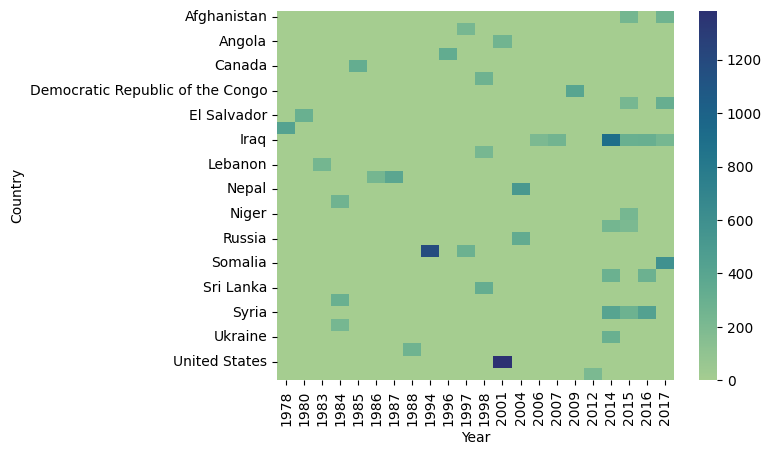

In [ ]:
sns.heatmap(attack, cmap='crest')

## Types of attack occur

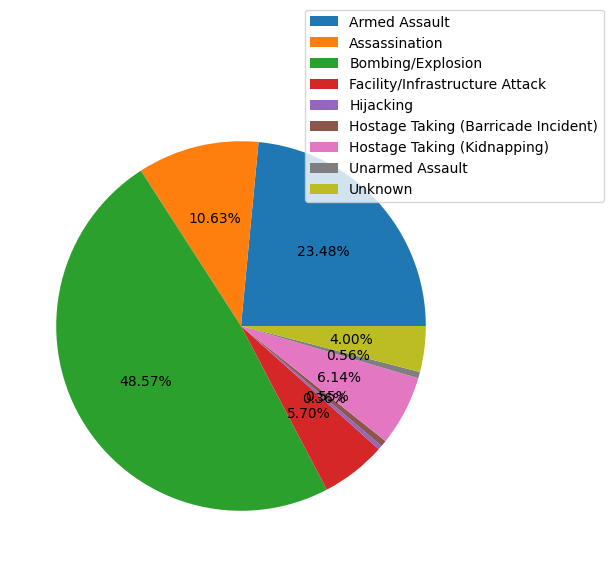

In [ ]:
attk = data.groupby(['Attack_type']).size().reset_index(name='count')

plt.figure(figsize=(6, 6))
plt.pie(attk['count'], autopct='%.2f%%')
plt.legend(labels=attk['Attack_type'], loc = 'upper right', bbox_to_anchor = (1.3,1.2))
plt.show()

## Most dangerous Gangs

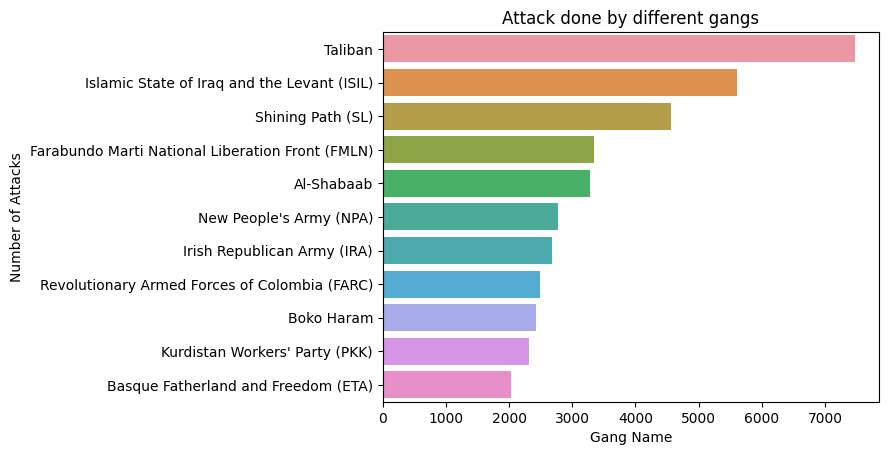

In [ ]:
# Excluding the unknown attacks
gang = data.groupby(['Gang_name']).size().reset_index(name='count').sort_values(by='count', ascending=False)[1:12]

sns.barplot(y='Gang_name', x='count', data=gang)
plt.xlabel('Gang Name')
plt.ylabel('Number of Attacks')
plt.title('Attack done by different gangs')
plt.show()

## Ways of attacking of Taliban Gang

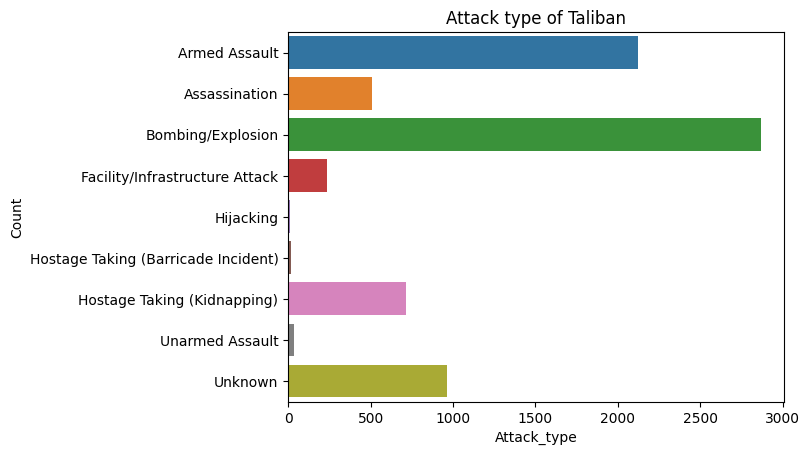

In [ ]:
tali = data[data['Gang_name'] == 'Taliban']
tali = tali.groupby(['Attack_type']).size().reset_index(name='count')

sns.barplot(y='Attack_type', x='count', data=tali)
plt.xlabel('Attack_type')
plt.ylabel('Count')
plt.title("Attack type of Taliban")
plt.show()

## Most attacked targets

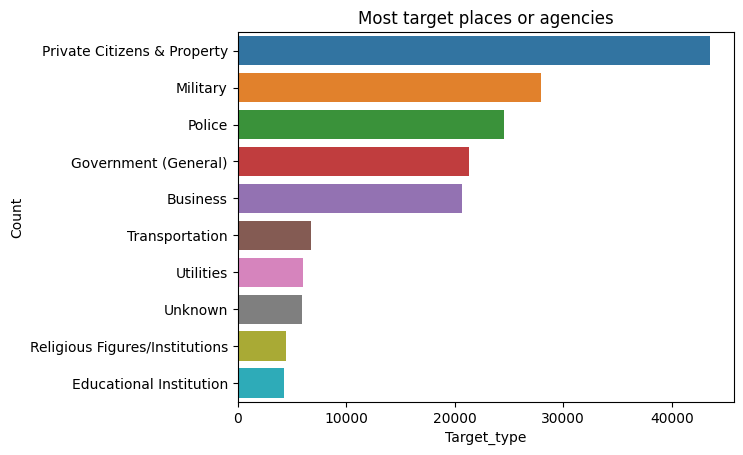

In [ ]:
trgt = data.groupby(['Target_type']).size().reset_index(name='count').sort_values(by='count', ascending=False)[:10]

sns.barplot(y='Target_type', x='count', data=trgt)
plt.xlabel('Target_type')
plt.ylabel('Count')
plt.title("Most target places or agencies")
plt.show()

## Attacks of year 2014 and their locations

In [ ]:
import folium
from folium.plugins import MarkerCluster

yr17 = data[data['Year'] == 2014]
yr17 = yr17[['Country', 'Latitude', 'Longitude']]
yr17 = yr17.dropna()
yr17_list = yr17.values.tolist()

In [ ]:
map = folium.Map(location = [0, 30], tiles = 'CartoDB positron', zoom_start=2)
marker = folium.plugins.MarkerCluster().add_to(map)

for point in range(len(yr17_list)):
  folium.Marker(location=[yr17_list[point][1], yr17_list[point][2]], popup = yr17_list[point][0]).add_to(marker)

map